# Proiect PAIC: A New Adaptive Switching Median Filter (ASWM)<hr/>Bulai Radu-Alexandru (411-TAID, ETTI UPB)

## Cuprins

  - Citirea si afisarea imaginilor
  - Definirea functiei de zgomot impulsiv (sare si piper) si aplicarea acesteia pe imagini
  - Implementarea filtrelor median clasic si SWM (Switching Median Filter)
    - Filtrul median clasic
    - Filtrul median "comutativ" (Switching Median Filter - SWM)
    - Aplicarea filtrelor clasic median si SWM pe o imagine
  - Implementarea filtrului ASWM (din articol)
    - Aplicarea filtrului ASWM pe o imagine
  - Functii pentru masurarea zgomotului (PSNR, MAE)
  - Compararea celor 3 filtre: Median, SWM, ASWM
  - Rezultate
  - Concluzii
    - Rezultate
    - Distorsiuni
    - Imagini cu nivele de gri vs color
    - Performante
  - Bibliografie

## Citirea si afisarea imaginilor
Pentru ca rezultatele testelor să fie cât mai concludente, s-au ales 6 imagini color a căror rezoluție a fost modificată (`512x512` px) pentru a corespunde cu celelalte citite.

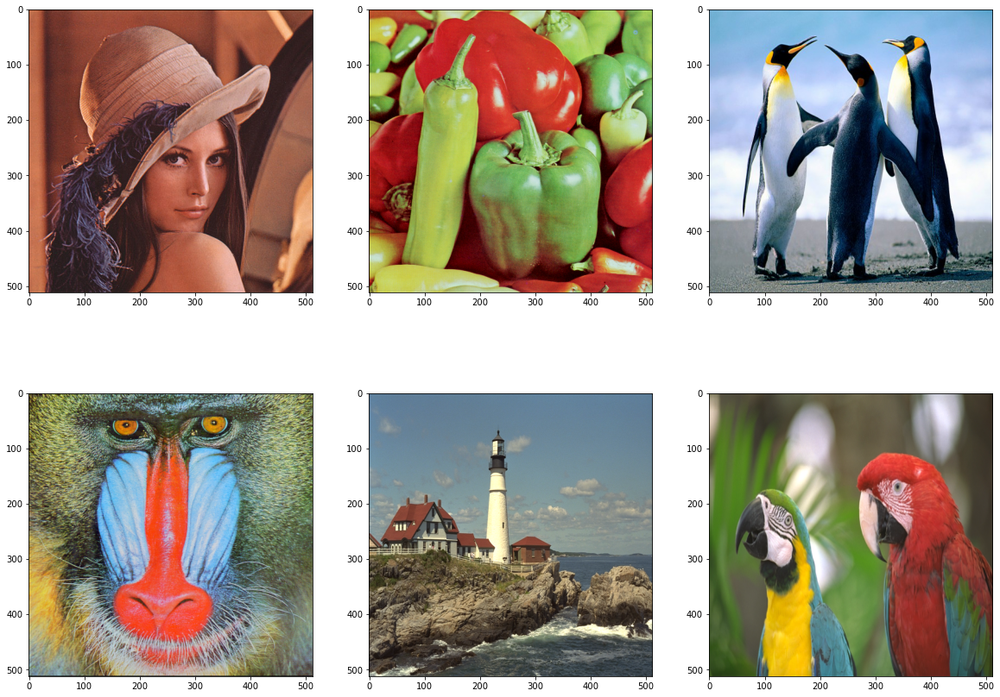

In [1]:
from skimage import io, color, measure
import matplotlib.pyplot as plt
import numpy as np

dir_path = './images/'
img_names = ['lena_color_512.bmp', 'peppers_512.png', 'penguins_512.jpg',
             'baboon_512.png', 'lighthouse_512.bmp', 'parrots_512.bmp']

img_paths = [dir_path + _ for _ in img_names]

fig = plt.figure(figsize=(20, 15))

for i, img_path in enumerate(img_paths):
    img = io.imread(img_path)
    fig.add_subplot(2,3,i+1); plt.imshow(img)

## Definirea functiei de zgomot impulsiv (sare si piper) si aplicarea acesteia pe imagini

In [2]:
def sp_noise(img_orig, ratio = 0.1):
    img = img_orig.copy()
    l, c, ch = img.shape
    length = int(l * c * ratio)
    lin = np.random.randint(0, l, [length])
    col = np.random.randint(0, c, [length])
    up_down = np.random.randint(0, 2, [length])
    for i in range(length):
        img[lin[i], col[i], np.random.randint(0, 3)] = 255 * up_down[i]
    return img

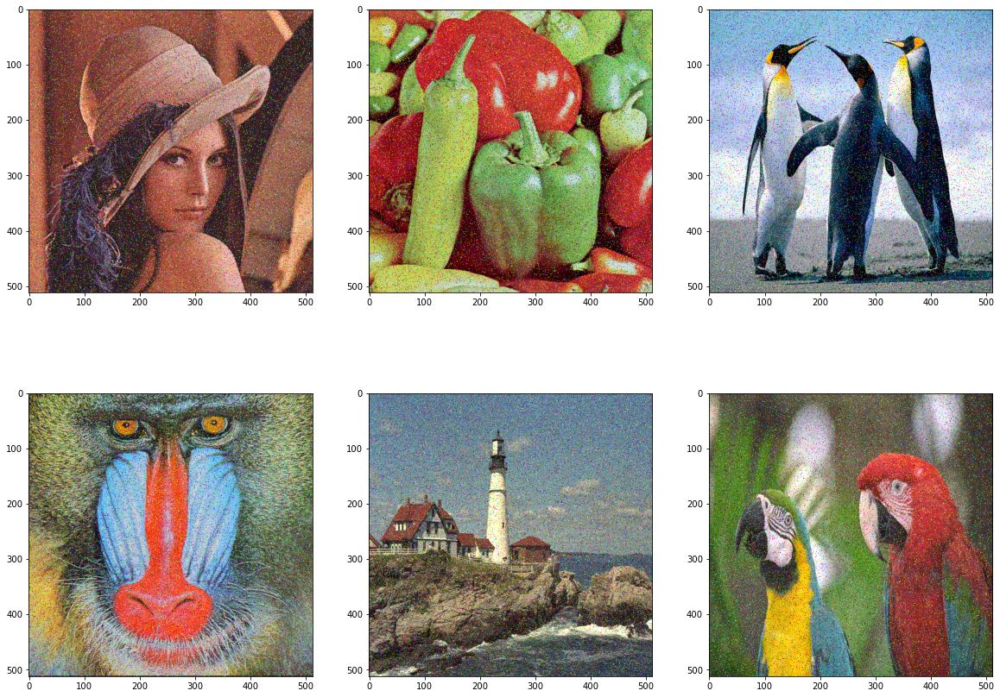

In [3]:
prob = 0.3

fig = plt.figure(figsize=(20, 15))

for i, img_path in enumerate(img_paths):
    img = io.imread(img_path)
    img_noise = sp_noise(img, prob)
    fig.add_subplot(2,3,i+1); plt.imshow(img_noise)

## Implementarea filtrelor median clasic si SWM (Switching Median Filter)

### Filtrul median clasic

In [4]:
def median_filter(img):
    img_out = img.copy()
    
    l, c, ch = img_out.shape
    for k in range(ch):
        for i in range(1, l - 2):
            for j in range(1, c - 2):
                V = np.sort(img[i-1:i+2, j-1:j+2, k], axis = None)
                img_out[i, j, k] = V[4]
                
    return img_out.astype(np.uint8)

### Filtrul median "comutativ" (Switching Median Filter - SWM)
Filtrul SWM este mai eficient în eliminarea zgomotului de impuls și păstrarea caracteristicilor imaginii. Filtrul înlocuiește un pixel deteriorat de valoarea mediană sau de valoarea procesată a pixelului învecinat. Pixelii necorupți sunt lăsați nemodificați[2].

![Switching Median Filter SWM Algorithm](./formule/SWM_Algorithm.jpg)

unde, $A_{ij}$ este intensitatea pixelului central din fereastra de filtrare, $A_{min}$, $A_{max}$ și $A_{med}$ sunt valoarea minimă, maximă și medie a pixelilor din fereastra de filtrare a imaginii zgomotoase. $A_{i-1, j}$ este intensitatea pixelului imediat vecin, deja procesat.

[2] *Pushpavalli, R., and G. Sivaradje. "Switching median filter for Image Enhancement." International Journal of Scientific & Engineering Research 3.2 (2012): 1-5.
Sursa: https://www.ijser.org/researchpaper/switching-median-filter-for-image-enhancement.pdf*

In [5]:
def swm_filter(img):
    img_out = img.copy()
    
    l, c, ch = img_out.shape
    for k in range(ch):
        for i in range(1, l - 2):
            for j in range(1, c - 2):    
                V = np.sort(img[i-1:i+2, j-1:j+2, k], axis = None)
                V_min, V_max = V[0], V[-1]
                
                if V_min < img_out[i, j, k] < V_max:
                    pass # no filtering needed
                else:
                    median = V[4]
                    if median != V_min and median != V_max:
                        img_out[i, j, k] = median
                    else:
                        img_out[i, j, k] = img_out[i-1, j, k]
                
    return img_out.astype(np.uint8)

### Aplicarea filtrelor clasic median si SWM pe o imagine

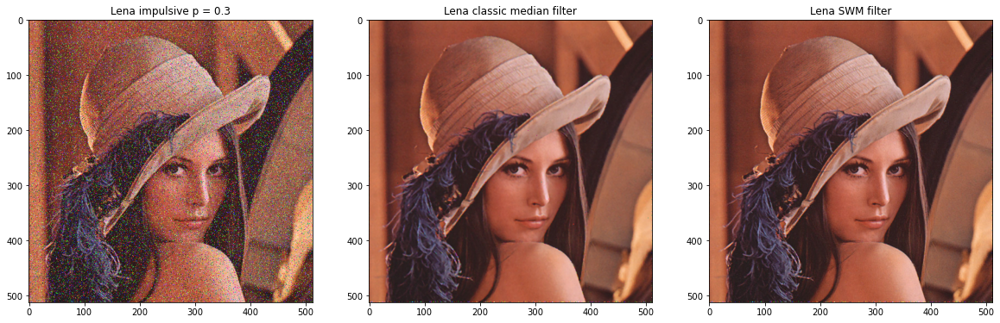

In [8]:
path = './images/'
img_path = path+'lena_color_512.bmp'

prob = 0.3

img = io.imread(img_path)
img_noise = sp_noise(img, prob)

img_median = median_filter(img_noise)
img_swm = swm_filter(img_noise)

fig = plt.figure(figsize=(20, 15))
fig.add_subplot(1,3,1).set_title(f'Lena impulsive p = {prob}'); plt.imshow(img_noise)
fig.add_subplot(1,3,2).set_title('Lena classic median filter'); plt.imshow(img_median)
fig.add_subplot(1,3,3).set_title('Lena SWM filter'); plt.imshow(img_swm)

## Implementarea filtrului ASWM (din articol)

Filtrul ASWM nu necesită un prag a priori ca în cazul unui filtru clasic de mediere comutativ. În schimb, pragul este calculat local din valorile intensității pixelilor imaginii într-o fereastră glisantă. Rezultatele din articol arată că ASWM oferă o performanță mai bună în termeni de PSNR și MAE decât multe alte variante de filtru median pentru zgomotul impulsiv. În plus, articolul precizează că filtrul poate păstra mai multe detalii de imagine într-un mediu cu zgomot ridicat.

Pentru filtrul ASWM, valoarea medie ponderată și deviația standard ponderată sunt estimate în fereastra curentă. Ponderile sunt inversul distanței dintre valoarea medie ponderată a pixelilor dintr-o fereastră dată și pixelul considerat. Ca rezultat, zgomotul impulsiv nu corupe determinarea acestor statistici din care se derivă pragul.

În fiecare fereastră, media ponderată este mai întâi estimată iterativ. Apoi se calculează abaterea standard ponderată și se determină pragul.

Pașii algoritmului sunt următorii:

#### Inițializare
- Pentru fiecare fereastră, se va calcula valoarea medie ponderată $M_w$ într-o fereastră de dimensiune aleasă `5x5` ce înconjoară pixelul curent din parcurgerea imaginii
  
![Weighted_Mean_Value.jpg](./formule/Weighted_Mean_Value.jpg)

unde $X_{i,j}$ reprezintă nivelul de luminozitate al pixelului aflat pe poziția $i, j$, iar $w_{k,l}$ ponderile pixelilor din acea vecinătate (fereastră), care sunt în primă fază inițializate cu 1.
  
#### Pasul 1
- Se estimează noile ponderi în funcție de $\delta$, o valoare setată implicit $\delta = 0.1$ pentru a se evita împărțirile la zero

![weights](./formule/weights.jpg)

- Se recalculează valoarea medie ponderată folosind formula utilizată anterior

#### Pasul 2

- Se verifică condiția:

![condition](./formule/condition.jpg)

unde $\epsilon$ reprezintă o valoare implicită egală cu $\epsilon = 0.01$, iar $M_w(i,j)^t$, $M_w(i,j)^{t-1}$ reprezintă valoarea medie ponderată la iterația $t$, respectiv iterația anterioară $t-1$.

- Dacă condiția este adevărată, atunci se opresc iterațiile pentru recalcularea valorii medii, și se trece la pasul următor
- Dacă condiția nu este îndeplinită, se revine la pasul 1

#### Pasul 3

- Se calculează deviația standard ponderată $\sigma_w(i,j)$ pentru fereastra curentă

![Weighted Standard Deviation](./formule/Weighted_Standard_Deviation.jpg)

#### Pasul 4

- Se folosește următoare regulă de decizie:

![AWWM Filter decision rule](./formule/decision_rule.jpg)

unde $m_{i,j}$ reprezintă medianul ferestrei curente $W_{i,j}$ iar $\alpha$ reprezintă un prag (inițiliazat cu $\alpha = 20$) ce descrește la fiecare iterație printr-o înmulțire cu 0.8.

![AWWM Filter Threshold](./formule/alpha_threshold.jpg)

- Se trece la următorul pixel din parcurgerea imaginii și se revine la inițializare și pasul 1

In [6]:
def ASWM_filter(img, delta = 0.1, error = 0.01):
    img_out = img.copy()
    l, c, ch = img_out.shape
    
    for k in range(ch):
        for i in range(1, l - 2):
            for j in range(1, c - 2):
                alpha = 20
                window = img[i-1:i+2, j-1:j+2, k]
                
                # Initialization
                weights = np.array([[[1] * 3] * 3])
                windowMean = np.sum(np.multiply(weights, window)) / np.sum(weights)
                    
                while True:
                    windowMeanOld = windowMean
                    
                    # Step 1: Estimate the weights
                    weights = 1 / (np.abs((window - windowMean)) + delta)
                    windowMean = np.sum(np.multiply(weights, window)) / np.sum(weights)
                    
                    # Step 2 condtion
                    if np.abs(windowMean - windowMeanOld) < error:
                        break
                    alpha *= 0.8
                
                windowStdDeviation = np.sqrt(np.sum(np.multiply(weights, (window - windowMean)**2)) / np.sum(weights))
                
                if np.abs(img_out[i, j, k] - windowMean) > (alpha * windowStdDeviation):
                    img_out[i, j, k] = np.sort(window, axis = None)[4]
                else:
                    img_out[i, j, k] = img_out[i, j, k]
                
    return img_out.astype(np.uint8)

Testare filtru ASWM pe o imagine de dimensiune mică (`64 x 64`) / Debug

In [137]:
from datetime import datetime
tic = datetime.now()

path = './images/'
img_path = path+'lena_color_64.bmp'

img = io.imread(img_path)
img_noise = sp_noise(img, 0.3)

ASWM_filter(img_noise)
print(f'Duration: {datetime.now() - tic}')

Duration: 0:00:04.789234


### Aplicarea filtrului ASWM pe o imagine

Duration: 0:04:53.220245


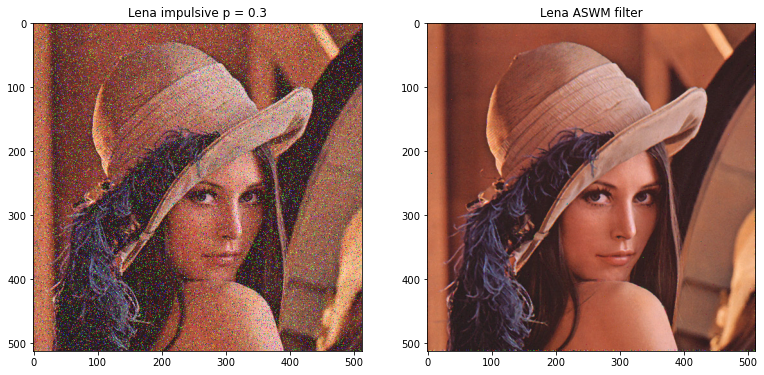

In [136]:
from datetime import datetime
tic = datetime.now()

path = './images/'
img_path = path+'lena_color_512.bmp'

prob = 0.3

img = io.imread(img_path)
img_noise = sp_noise(img, prob)

img_ASWM = ASWM_filter(img_noise)

fig = plt.figure(figsize=(20, 15))
fig.add_subplot(1,2,1).set_title(f'Lena impulsive p = {prob}'); plt.imshow(img_noise)
fig.add_subplot(1,2,2).set_title('Lena ASWM filter'); plt.imshow(img_ASWM)

print(f'Duration: {datetime.now() - tic}')

## Functii pentru masurarea zgomotului (PSNR, MAE)

In [7]:
# Mean squared error
def mse(imgInit, imgFinal): 
    r = np.asarray(imgInit, dtype=np.float64).ravel()
    c = np.asarray(imgFinal, dtype=np.float64).ravel()
    return np.mean(np.abs(r - c)**2)

# Peak signal-to-noise ratio
def PSNR(imgInit, imgFinal):
    rng = imgInit.max() - imgFinal.min()
    dv = (rng + 0.0)**2
    with np.errstate(divide='ignore'):
        rt = dv / mse(imgInit, imgFinal)
    return 10.0 * np.log10(rt)

# Mean absolute error
def MAE(imgInit, imgFinal):  
    r = np.asarray(imgInit, dtype=np.float64).ravel()
    c = np.asarray(imgFinal, dtype=np.float64).ravel()
    return np.mean(np.abs(r - c))

## Compararea celor 3 filtre: Median, SWM, ASWM

./images/lena_color_256.bmp, Total duration: 0:01:08.910994 (1.34s Median) (1.18s SWM) (66.12s ASWM)
Median_PSNR = 27.931 dB, Median_MAE = 4.022
SWM_PSNR = 29.772 dB, SWN_MAE = 1.601
ASWM_PSNR = 28.521 dB, ASWM_MAE = 2.317

./images/peppers_256.png, Total duration: 0:01:08.746201 (1.04s Median) (1.18s SWM) (66.26s ASWM)
Median_PSNR = 28.052 dB, Median_MAE = 3.161
SWM_PSNR = 29.351 dB, SWN_MAE = 1.329
ASWM_PSNR = 28.555 dB, ASWM_MAE = 1.714

./images/penguins_256.jpg, Total duration: 0:01:07.053629 (1.05s Median) (1.25s SWM) (64.51s ASWM)
Median_PSNR = 26.627 dB, Median_MAE = 3.822
SWM_PSNR = 28.640 dB, SWN_MAE = 1.656
ASWM_PSNR = 27.070 dB, ASWM_MAE = 2.551

./images/baboon_256.png, Total duration: 0:01:10.993624 (1.09s Median) (1.19s SWM) (68.46s ASWM)
Median_PSNR = 23.026 dB, Median_MAE = 10.745
SWM_PSNR = 26.073 dB, SWN_MAE = 3.946
ASWM_PSNR = 23.729 dB, ASWM_MAE = 7.584

./images/lighthouse_256.bmp, Total duration: 0:01:06.618931 (1.09s Median) (1.19s SWM) (64.08s ASWM)
Median_PSNR

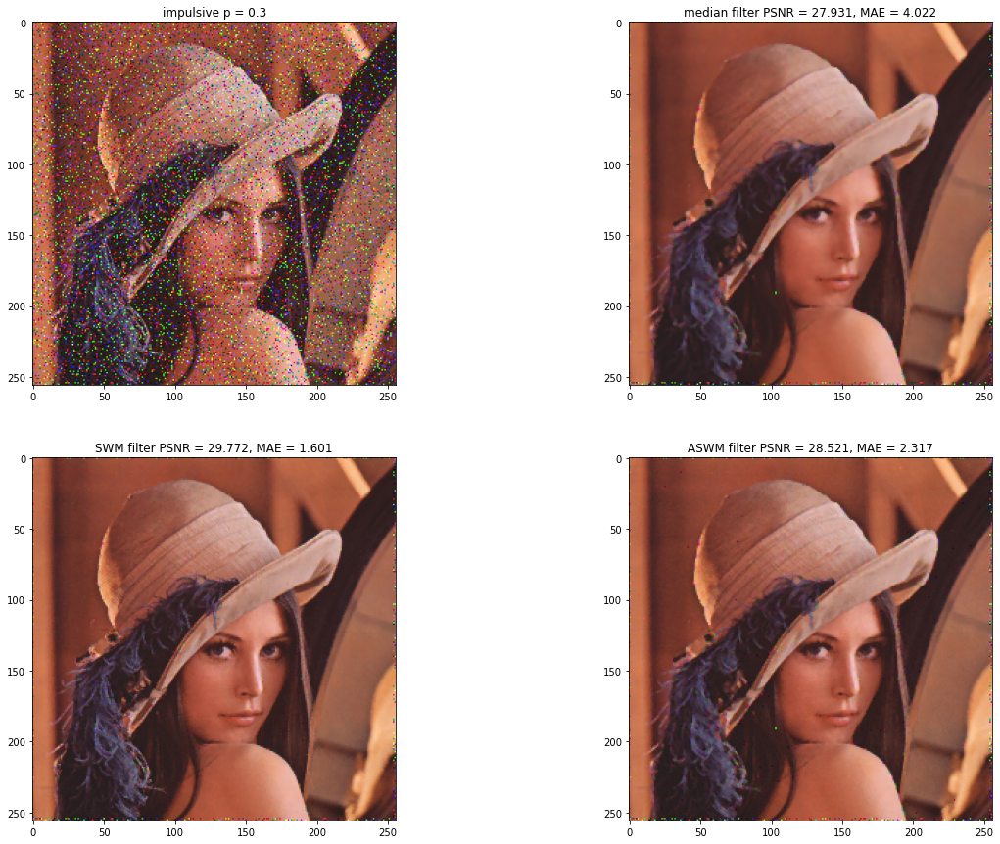

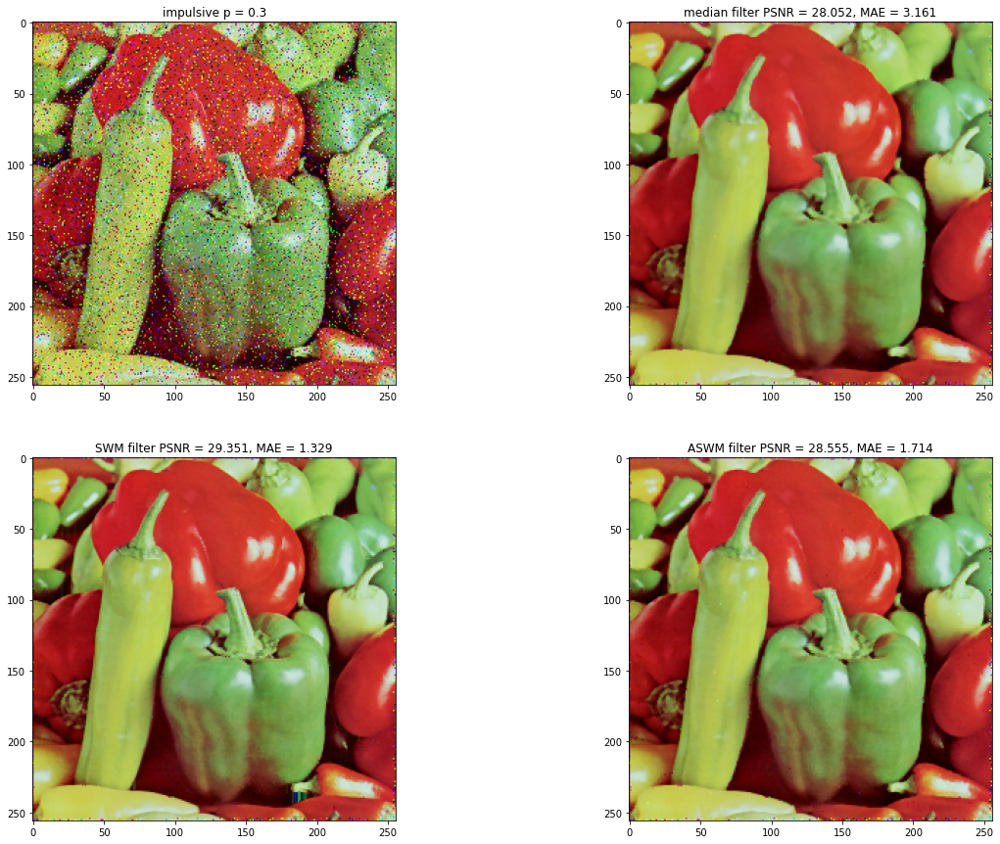

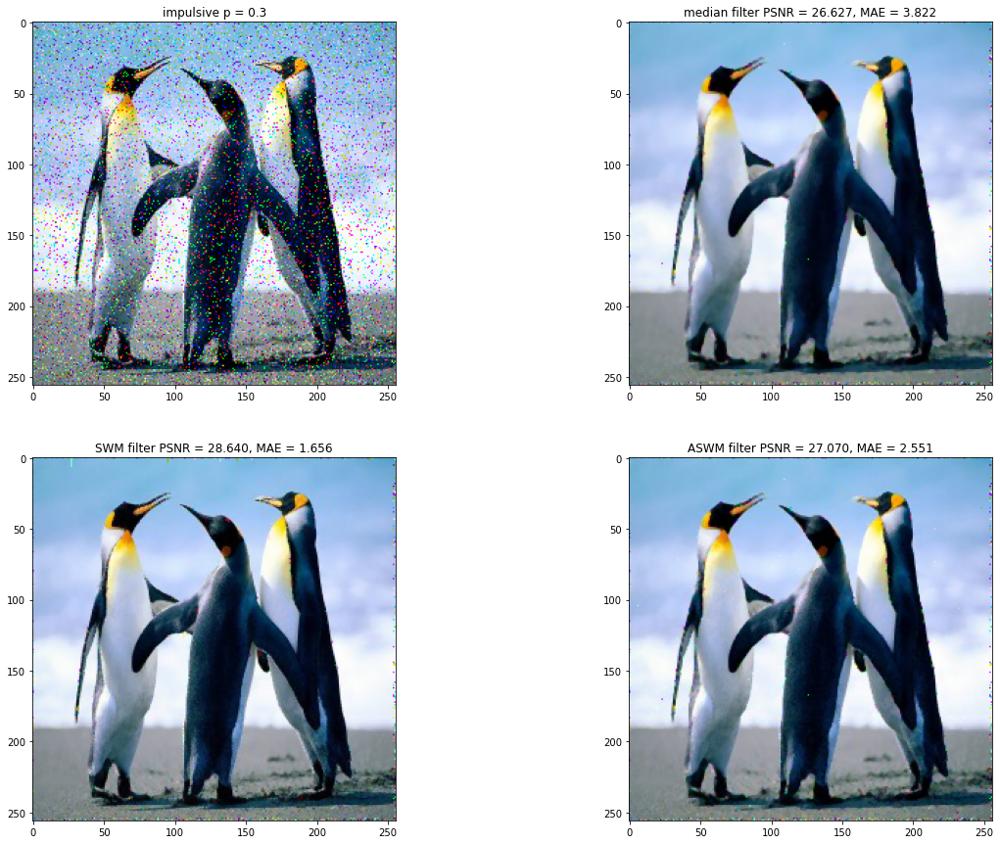

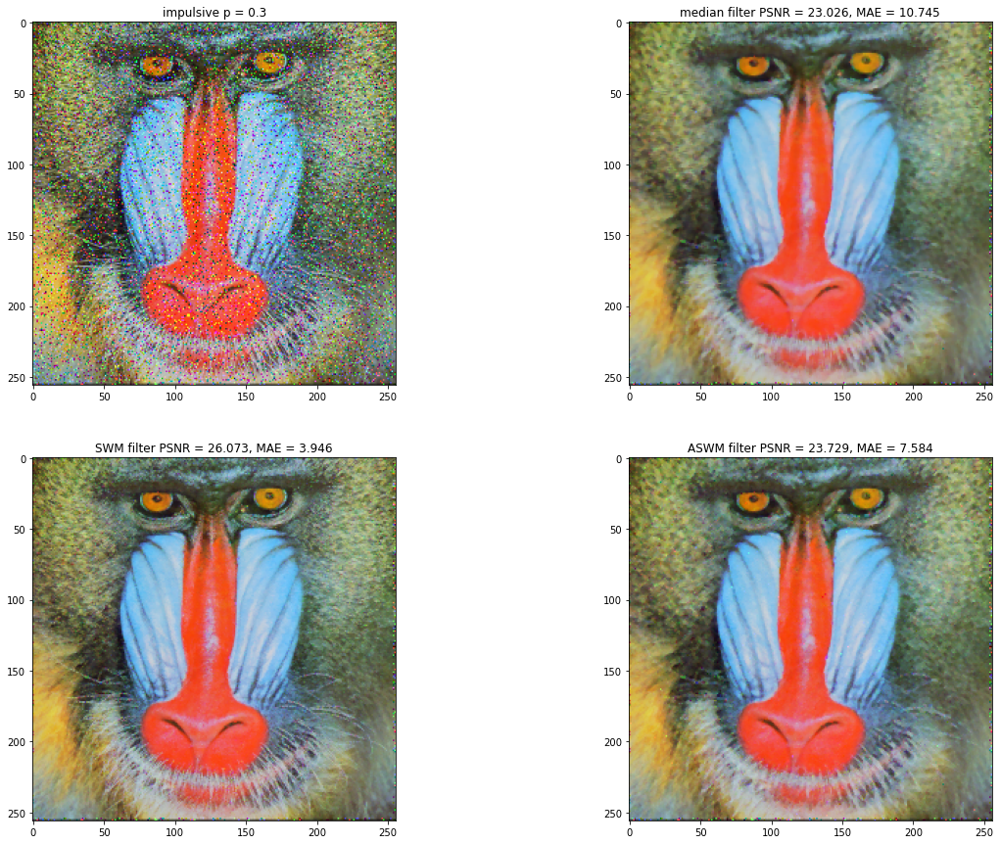

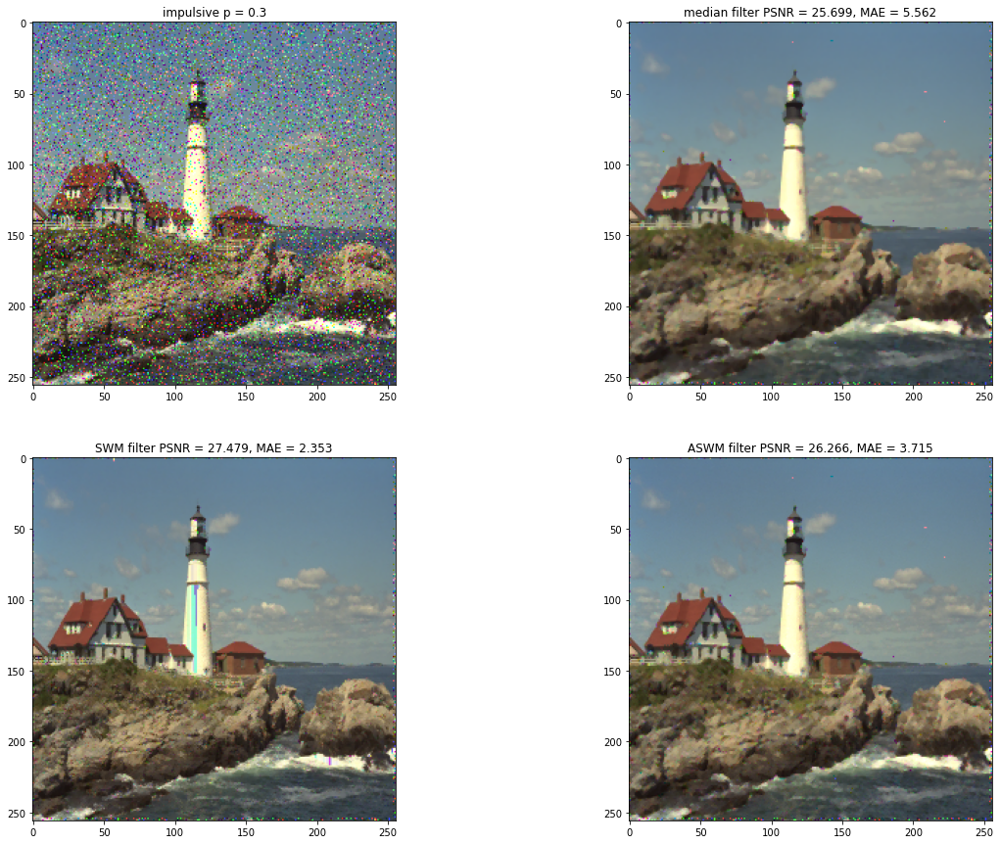

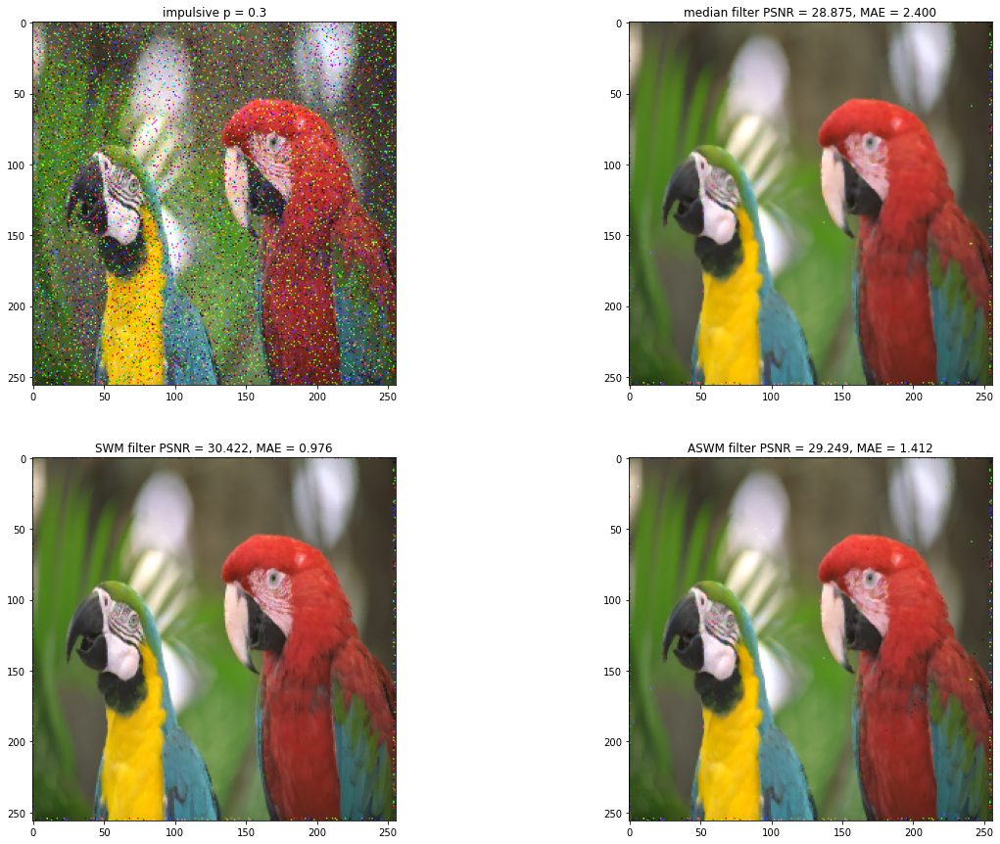

In [10]:
from datetime import datetime
from time import time

dir_path = './images/'
img_names = ['lena_color_256.bmp', 'peppers_256.png', 'penguins_256.jpg',
             'baboon_256.png', 'lighthouse_256.bmp', 'parrots_256.bmp']
img_paths = [dir_path + _ for _ in img_names]

prob = 0.3

for img_path in img_paths:
    tic = datetime.now()
    
    # Apply impulsive noise
    img = io.imread(img_path)
    img_noise = sp_noise(img, prob)
    
    # Apply filters
    time_med = time()
    img_median = median_filter(img_noise)
    time_med = time() - time_med
    
    time_swm = time()
    img_swm = swm_filter(img_noise)
    time_swm = time() - time_swm
    
    time_ASWM = time()
    img_ASWM = ASWM_filter(img_noise)
    time_ASWM = time() - time_ASWM
    
    # Compute PSNR, MAE
    img_median_PSNR = PSNR(img, img_median)
    img_median_MAE = MAE(img, img_median)
    
    img_swm_PSNR = PSNR(img, img_swm)
    img_swm_MAE = MAE(img, img_swm)
    
    img_ASWM_PSNR = PSNR(img, img_ASWM)
    img_ASWM_MAE = MAE(img, img_ASWM)
    
    # Show images
    fig = plt.figure(figsize=(20, 15))
    fig.add_subplot(2,2,1).set_title(f'impulsive p = {prob}'); plt.imshow(img_noise)
    fig.add_subplot(2,2,2).set_title(f'median filter PSNR = {img_median_PSNR:.3f}, MAE = {img_median_MAE:.3f}');
    plt.imshow(img_median)
    fig.add_subplot(2,2,3).set_title(f'SWM filter PSNR = {img_swm_PSNR:.3f}, MAE = {img_swm_MAE:.3f}');
    plt.imshow(img_swm)
    fig.add_subplot(2,2,4).set_title(f'ASWM filter PSNR = {img_ASWM_PSNR:.3f}, MAE = {img_ASWM_MAE:.3f}');
    plt.imshow(img_ASWM)
    
    # Print duration, PSNR & MAE values
    toc = datetime.now()
    print(f'{img_path}, Total duration: {toc - tic} ({time_med:.2f}s Median) ({time_swm:.2f}s SWM) ({time_ASWM:.2f}s ASWM)')
    print(f'Median_PSNR = {img_median_PSNR:.3f} dB, Median_MAE = {img_median_MAE:.3f}')
    print(f'SWM_PSNR = {img_swm_PSNR:.3f} dB, SWN_MAE = {img_swm_MAE:.3f}')
    print(f'ASWM_PSNR = {img_ASWM_PSNR:.3f} dB, ASWM_MAE = {img_ASWM_MAE:.3f}\n')

## Rezultate
Având valorile PSNR, MAE pentru fiecare din imaginile afișate, putem întocmi următorul tabel:

| Image / Filter |           | Median | SWM    | ASWM   |
|----------------|-----------|--------|--------|--------|
| lena_color_512 | PSNR (dB) | 29.902 | 32.153 | 30.783 |
|                | MAE       | 3.832  | 1.451  | 2.012  |
| peppers_512    | PSNR (dB) | 29.134 | 30.474 | 30.011 |
|                | MAE       | 4.044  | 1.789  | 2.109  |
| penguins_512   | PSNR (dB) | 28.246 | 30.464 | 28.837 |
|                | MAE       | 3.53   | 1.585  | 2.279  |
| baboon_512     | PSNR (dB) | 22.448 | 25.895 | 23.193 |
|                | MAE       | 11.728 | 4.102  | 8.285  |
| lighthouse_512 | PSNR (dB) | 27.315 | 28.982 | 28.085 |
|                | MAE       | 4.807  | 2.044  | 2.95   |
| parrots_512    | PSNR (dB) | 32.475 | 34.025 | 32.929 |
|                | MAE       | 1.529  | 0.631  | 0.744  |

<center>Results on 512x512 images with a probabilty of 30% random-valued impulsive noise</center>

Putem rula din nou testele și întocmi tabele și pentru imagini cu rezoluții mai mici:

| Image / Filter |           | Median | SWM    | ASWM     |
|----------------|-----------|--------|--------|----------|
| lena_color_256 | PSNR (dB) | 27.931 | 29.772 | 28.521   |
|                | MAE       | 4.022  | 1.601  | 2.317    |
|                | Time (s)  | 1.34s  | 1.18s  | 66.12s   |
| peppers_256    | PSNR (dB) | 28.052 | 29.351 | 28.555   |
|                | MAE       | 3.161  | 1.329  | 1.714    |
|                | Time (s)  | 1.04s  | 1.18s  | 66.26s   |
| penguins_256   | PSNR (dB) | 26.627 | 28.64  | 27.07    |
|                | MAE       | 3.822  | 1.656  | 2.551    |
|                | Time (s)  | 1.05s  | 1.25s  | 64.51s   |
| baboon_256     | PSNR (dB) | 23.026 | 26.073 | 23.729   |
|                | MAE       | 10.745 | 3.946  | 7.584    |
|                | Time (s)  | 1.09s  | 1.19s  | 68.46s   |
| lighthouse_256 | PSNR (dB) | 25.699 | 27.479 | 26.266   |
|                | MAE       | 5.562  | 2.353  | 3.715    |
|                | Time (s)  | 1.09s  | 1.19s  | 64.08s   |
| parrots_256    | PSNR (dB) | 28.875 | 30.422 | 29.249   |
|                | MAE       | 2.4    | 0.976  | 1.412    |
|                | Time (s)  | 1.14s  | 1.20s  | 65.47s   |

<center>Results on 256x256 images with a probabilty of 30% random-valued impulsive noise</center>

| Image / Filter |           | Median | SWM    | ASWM    |
|----------------|-----------|--------|--------|---------|
| lena_color_128 | PSNR (dB) | 26.113 | 27.49  | 26.473  |
|                | MAE       | 4.259  | 1.79   | 2.716   |
|                | Time (s)  | 0.25s  | 0.31s  | 16.87s  |
| peppers_128    | PSNR (dB) | 25.203 | 26.901 | 25.63   |
|                | MAE       | 4.336  | 1.734  | 1.734   |
|                | Time (s)  | 0.28s  | 0.29s  | 17.54s  |
| penguins_128   | PSNR (dB) | 24.306 | 26.353 | 24.659  |
|                | MAE       | 5.092  | 2.124  | 3.559   |
|                | Time (s)  | 0.27s  | 0.27s  | 16.07s  |
| baboon_128     | PSNR (dB) | 23.896 | 26.077 | 24.58   |
|                | MAE       | 8.988  | 3.46   | 6.121   |
|                | Time (s)  | 0.27s  | 0.29s  | 16.96s  |
| lighthouse_128 | PSNR (dB) | 25.147 | 26.814 | 25.685  |
|                | MAE       | 5.584  | 2.371  | 3.75    |
|                | Time (s)  | 0.26s  | 0.28s  | 16.30s  |
| parrots_128    | PSNR (dB) | 26.291 | 27.383 | 26.619  |
|                | MAE       | 3.398  | 1.459  | 2.135   |
|                | Time (s)  | 0.33s  | 0.33s  | 16.67s  |

<center>Results on 128x128 images with a probabilty of 30% random-valued impulsive noise</center>

## Concluzii

### Rezultate
Din tabelele afișate anterior, putem observa că filtrul SWM (Filtrul median comutativ) oferă cele mai bune rezultate din punct de vedere al valorilor Raportului de vârf Semnal-Zgomot și al erorii absolute medii.

În fiecare din cazuri observăm că filtrul ASWM prezentat în articol oferă totuși rezultate mai bune față de filtrul median clasic, în special în cazurile în care este aplicat pe imagini de o rezoluție mai înaltă (exemplu `512x512` px).


### Distorsiuni
Cu toate ca filtrul SWM filtrează cel mai bine imaginea dpv al valorilor PSNR, MAE, la aplicarea acestuia pe anumite imagini, pot apărea anumite distorsiuni. Spre exemplu, în cazul imaginii `lighthouse.bmp`, în centrul farului se pot observa dungi neobișnuite. Aceste distorsiuni pot apărea datorită preluării nivelului de luminanță al pixelului anterior pentru cazul în care valoarea mediană în sine este "coruptă" (anume valoarea mediană din fereastră este egală cu una din valorile aflate la extremități, după sortare). 

În cazul filtrului median clasic și ASWM, nu apar distorsiuni sesizabile.

### Imagini cu nivele de gri vs color
Algoritmul din articol a fost implementat cu scopul de a filtra imaginile cu nivele de gri, astfel, la aplicarea filtrului ASWM nu ar trebui să ne așteptăm la rezultate mai bune pentru imaginilor color.

Totodată, considerând acest aspect, rezultatele valorilor PSNR, MAE din articol pot diferi față de rezultatele obținute anterior în acest proiect.

### Performante
Filtrul ASWM este cel slab din punct de vedere al performanței, fiind necesar un timp computațional mult mai ridicat față de algoritmii pentru filtrul median clasic, respectiv SWM. Putem lua ca exemplu imaginea `lena_color_256.bmp`, pentru care am obținut timpii `(1.34s Median)` `(1.18s SWM)` `(66.12s ASWM)`, unde timpul necesar de calcul aplicării filtrului ASWM este de aproximativ 55 de ori mai mare. 

Filtrul ASWM aduce un calcul adițional pentru a estima iterativ ponderile și valoarea medie ponderată și pentru a calcula deviația standard ponderată pentru fiecare fereastră ce încojoară pixelul curent. Astfel întreg procesul aduce costuri computaționale foarte mari comparativ cu filtrele median clasic și SWM.

## Bibliografie
[1] *Akkoul, Smaïl, et al. "A new adaptive switching median filter." IEEE Signal Processing Letters 17.6 (2010): 587-590.<br/>
Link: https://ieeexplore.ieee.org/abstract/document/5451149*

[2] *Pushpavalli, R., and G. Sivaradje. "Switching median filter for Image Enhancement." International Journal of Scientific & Engineering Research 3.2 (2012): 1-5.<br/>
Link: https://www.ijser.org/researchpaper/switching-median-filter-for-image-enhancement.pdf*

 # Bulai Radu-Alexandru (411-TAID, ETTI UPB)